# CREAZIONE DELL'IMMAGINE E STUDIO DI UNA GALASSIA A PARTIRE DA DATI SIMULATI

L’obiettivo di questo lavoro è ricostruire l’immagine di una galassia, a partire dai dati della simulazione cosmologica IllustrisTNG, e trasformarla progressivamente in un’immagine realistica, come se fosse osservata da un telescopio da Terra, includendo disturbi atmosferici, strumentali e di fondo. Per valutare la qualità dell’immagine finale ottenuta, è stato calcolato il rapporto segnale-rumore; inoltre, per una comprensione più approfondita della natura della galassia simulata, sono state realizzate due appendici in cui si sono studiate la sua distribuzione spettrale (SED), l’età e la metallicità delle sue stelle, e il diagramma colore-magnitudine.  
Il programma è applicabile ad una qualsiasi galassia del cutout "Milky-Way/Andromeda galaxies like", nello specifico in questo lavoro si è preso in considerazione il cutout "494709" e tutte le considerazioni ed i commenti dei risultati sono relativi ad esso.

# 1° PASSAGGIO : APERTURA DEL FILE DI SIMULAZIONE DELLA GALASSIA PRESO DA ILLUSTRIS TNG

IllustrisTNG (The Next Generation) è una simulazione cosmologica progettata per studiare la formazione e l’evoluzione delle strutture cosmiche su larga scala.  
L'obiettivo principale della simulazione è comprendere i meccanismi fisici che regolano l’evoluzione delle galassie, l’accrescimento dei buchi neri supermassicci, il feedback energetico del gas, la formazione stellare e la distribuzione della materia oscura, in un contesto cosmogonico realistico, coerente con il modello standard $\Lambda$CDM.  
Le simulazioni vengono eseguite in volumi cubici periodici di diverse dimensioni e utilizzano milioni o miliardi di particelle per rappresentare le componenti fondamentali dell’universo: gas (PartType0), materia oscura (ParType1), stelle (PartType4) e buchi neri (ParType5).  
La simulazione produce una sequenza temporale di snapshot (in genere 100 per run), ciascuno dei quali rappresenta lo stato dell’universo a un determinato redshift. Ogni snapshot è salvato in formato HDF5 e contiene le proprietà di tutte le particelle presenti nel volume simulato. All’interno di ciascun gruppo sono contenuti i dataset relativi alle proprietà fisiche delle particelle, come coordinate, masse, velocità, età, metallicità, e magnitudini sintetiche.

Lo scopo di questo primo pasaggio è di leggere per intero i contenuti delle PartType e di acquisire successivamente i set di dati che si è deciso di utilizzaere, ovvero le coordinate delle particelle di tipo stellare e le loro magnitudini.

In [1]:
!pip install h5py   # installazione di h5py, una libreria per leggere file HDF5

In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.convolution import convolve, Gaussian2DKernel

filename = "494709.hdf5"
# Apro e ispeziono la struttura del file
with h5py.File(filename, 'r') as f:  # modalità di sola lettura ('r')
    def print_tree(name, obj):  # funzione per stampare la struttura del file
        print(name)
    f.visititems(print_tree) # chiama la funzione per ogni oggetto nel file e stampa il nome

Header
PartType0
PartType0/CenterOfMass
PartType0/Coordinates
PartType0/Density
PartType0/ElectronAbundance
PartType0/EnergyDissipation
PartType0/GFM_AGNRadiation
PartType0/GFM_CoolingRate
PartType0/GFM_Metallicity
PartType0/GFM_Metals
PartType0/GFM_MetalsTagged
PartType0/GFM_WindDMVelDisp
PartType0/GFM_WindHostHaloMass
PartType0/InternalEnergy
PartType0/InternalEnergyOld
PartType0/MH
PartType0/MH2BR
PartType0/MH2GK
PartType0/MH2KMT
PartType0/Machnumber
PartType0/MagneticField
PartType0/MagneticFieldDivergence
PartType0/MainSnapshotIndex
PartType0/Masses
PartType0/NeutralHydrogenAbundance
PartType0/ParticleIDs
PartType0/Potential
PartType0/RotatedCenterOfMass
PartType0/RotatedCoordinates
PartType0/RotatedMagneticField
PartType0/RotatedVelocities
PartType0/StarFormationRate
PartType0/SubfindDMDensity
PartType0/SubfindDensity
PartType0/SubfindHsml
PartType0/SubfindID
PartType0/SubfindVelDisp
PartType0/Velocities
PartType0/Xray_Emission_03_2keV
PartType0/Xray_Emission_03_2keV_C
PartType0/

In [3]:
# Scarico i dati che mi servono
with h5py.File(filename, 'r') as f:
    N = f["PartType4"]["GFM_StellarPhotometrics"].shape[0] # dove N è il numero di particelle per cui sono disponibili le magnitudini
    coords = f["PartType4"]["Coordinates"][:N]  #oordinate tridimensionali (x, y, z) delle particelle stellari,solo quelle che hanno anche magnitudine
    mags = f["PartType4"]["GFM_StellarPhotometrics"][:]  #magnitudini sintetiche per ciascuna particella, in 8 diverse bande fotometriche

COSA OTTENGO ? Nel progetto IllustrisTNG, non tutte le particelle stellari hanno magnitudini fotometriche calcolate: in particolare, le stelle troppo giovani (età < 3 Myr) o non ancora completamente formate non possiedono flussi associati. Per questo motivo, è fondamentale filtrare le particelle in base alla disponibilità del campo GFM_StellarPhotometrics, che fornisce le magnitudini sintetiche.  
Nel codice vengono quindi estratte le coordinate tridimensionali (coords, shape = N×3) e le magnitudini (mags, shape = N×8) solo per le particelle con fotometria definita. Le 8 bande fotometriche disponibili nel catalogo sono: u_SDSS, g_SDSS, r_SDSS, i_SDSS, z_SDSS (provenienti dalla survey SDSS) e U_Johnson, B_Johnson, V_Buser (bande del sistema Johnson-Buser). Le bande SDSS coprono l’intervallo dal vicino ultravioletto (NUV) al vicino infrarosso (NIR) e sono espresse nel sistema AB, mentre le bande Johnson-Buser rappresentano l’ottico classico e sono espresse nel sistema Vega, in cui il punto zero è definito sullo spettro della stella Vega.

# 2° PASSAGGIO : CREAZIONE DELLE IMMAGINI SUL PIANO XY (e distanza dall'osservatore pari a 0)

In questo passaggio prendo come input le coordinate stellari x e y e le magnitudini dei particelle nelle diverse bande fornite dal passaggio 1, elaboro le magnitudini convertendole in flussi relativi che vengono mappati su una griglia di pixel. Ottengo quindi come output una mappa bidimensionale del flusso luminoso per ciascuna delle 8 bande fotometriche

Le magnitudini astronomiche sono una scala logaritmica e inversa che misura la luminosità percepita di un oggetto. La definizione moderna è basata sulla relazione di Pogson: 
               $$M= -2.5 \cdot \log_{10}(\frac{F}{F0})$$
dove F è il flusso misura (energia ricevuta per unità di area, tempo e frequenza) e F0 è lo zeropoint di riferimento per quella banda. Il flusso quindi si ottiene con : 
               $$F=F0 \cdot 10^{-0.4 \cdot M}$$
Nel mio codice, nel passaggio seguente, considero F/F0 =flusso relativo (adimensionale); questo è sufficiente per costruire immagini fotometriche in scala arbitraria, dove conta solo il contrasto relativo. Si vedrà più avanti, nel passaggio 3, che per ottenere immagini più accurate e per poi calcolare SED e stimare i rumori, si è moltiplicato per gli F0 di riferimento di ciascuna banda.

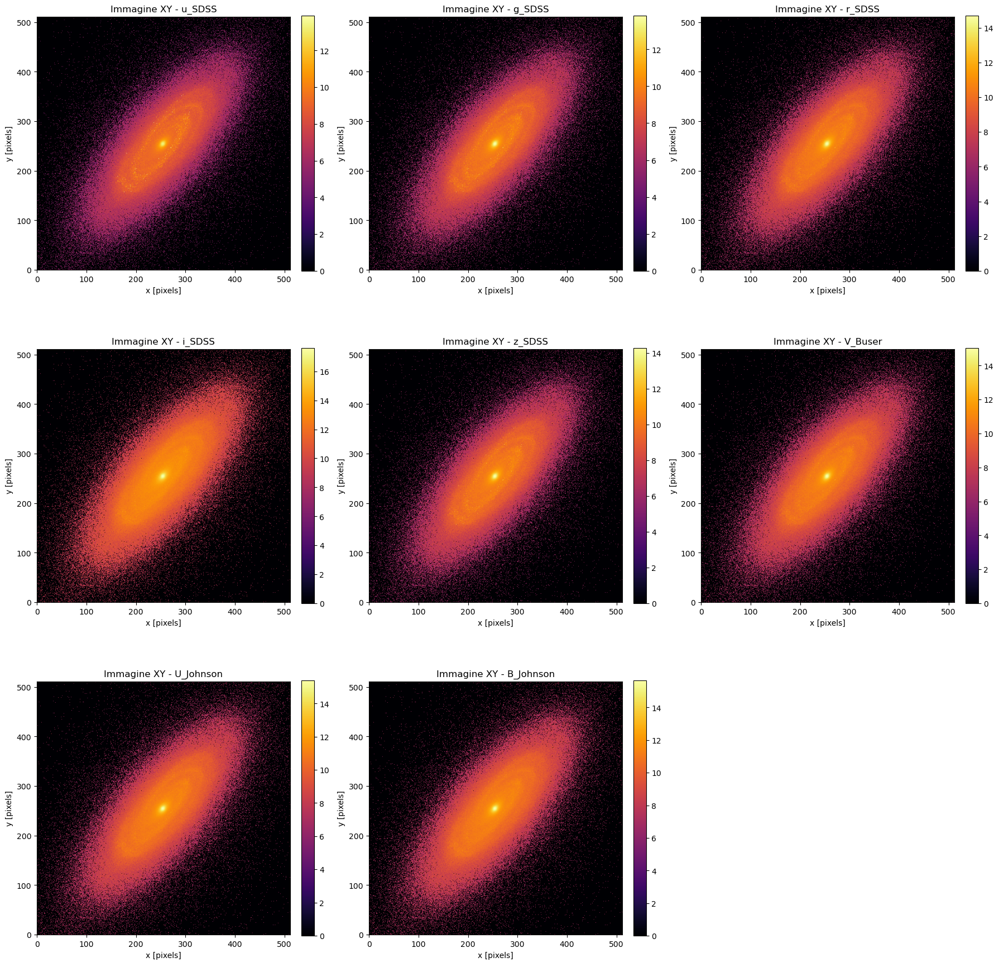

In [4]:
# Parametri delle immagini
img_size = 512  # pixel per lato 
fov = 50  # campo fisico da rappresentare, ovvero camera quadrata che inquadra 50 kpc

# Etichette delle 8 bande di GFM_StellarPhotometrics
band_labels = [
    "u_SDSS", "g_SDSS", "r_SDSS", "i_SDSS",
    "z_SDSS", "V_Buser", "U_Johnson", "B_Johnson"
]

# 1) Proietto le coordinate e creo la mappa
x = coords[:, 0] # estraggo coordinate
y = coords[:, 1]
x_center = np.median(x)  # posiziono il centro dell’immagine nel centro della galassia
y_center = np.median(y)
x_img = x - x_center  #da -fov/2 a fov/2
y_img = y - y_center

# 2) Converto coordinate (kpc) in pixel
# In particolare:  2.1)traslo il range da $[-fov/2, +fov/2]$ a $[0, fov]$,  
#                  2.2) normalizzo le coordinate nel range $[0, 1]$ dividendo per fov, 
#                  2.3)riscalo le coordinate su $[0, img_size]$,    
#                  2.4) converto in pixel interi (.astype(int))
pixels_x = ((x_img + fov/2) / fov * img_size).astype(int)
pixels_y = ((y_img + fov/2) / fov * img_size).astype(int)
# Elimino i pixel fuori dalla camera
valid = (pixels_x >= 0) & (pixels_x < img_size) & (pixels_y >= 0) & (pixels_y < img_size)

# 3) Calcolo il flusso e creo l'immagine
images_xy = []

for i, band in enumerate(band_labels): # scorro le bande
    flux = 10 ** (-0.4 * mags[:, i])  # converto magnitudini in flusso relativo
    image = np.zeros((img_size, img_size)) 
    np.add.at(image, (pixels_y[valid], pixels_x[valid]), flux[valid]) # per ogni pixel valido, sommo il flusso (NB: + particelle possono finire nello stesso pixel)
    images_xy.append(image) 

# 4) Plotto le 8 immagini delle 8 bande fotometriche
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (image, label) in enumerate(zip(images_xy, band_labels)): # zip()=associo ad ogni immagine la sua banda
    row = i // 3 # traduco l’indice lineare in "coordinate" (riga, colonna)
    col = i % 3
    ax = axs[row, col]
    im = ax.imshow(np.arcsinh(image), origin='lower', cmap='inferno') # uso arcsinh, per evidenziare sia le regioni brillanti, che quelle deboli
    ax.set_title(f"Immagine XY - {label}")
    ax.set_xlabel("x [pixels]")
    ax.set_ylabel("y [pixels]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04) # aggiungo una barra colore per interpretare il livello del flusso

axs[2, 2].axis('off') # Rimuovo il pannello vuoto in basso a destra 
plt.tight_layout()
plt.show()

OSSERVAZIONE : la formula utilizzata per calcolare i flussi relativi in realtà avrebbe bisogno della magnitudine apparente, tuttavia i dati forniti da StellarPhotometrics di Illustris sono delle magnitudini assolute. L'output ottenuto in questo passaggio quindi non è del tutto corretto, ma si utilizza come primo approccio sperimentale per il plot delle immagini della galassia. Nel passaggio 3, con il calcolo della magnitudine apparente, dopo aver posizionato la galassia ad una distanza scelta, si sono ri-ottenuti i flussi e di conseguenza le immagini, questa volte corrette e difatti sono quelle su cui si è portato avanti il lavoro. 

# 3° PASSAGGIO : POSIZIONAMENTO DELLA GALASSIA AD UNA DISTANZA ARBITRARIA

In questo step si utilizza lo stesso input del passaggio 2, ma si elaborano i dati in maniera differente, come dall'osservazione precedente e come spiegato nel dettaglio di seguito, e si ottiene come output la mappa in coordinate celesti (non più x e y, ma RA e DEC) del flusso (non più relativo, ma assoluto).  

Per simulare come una galassia verrebbe effettivamente osservata da un telescopio sulla Terra, è necessario ipotizzare una distanza realistica tra la galassia simulata e l’osservatore. Nel mio caso ho scelto una distanza arbitraria di 10 Mpc, che corrisponde a una galassia del vicino universo.  
Converto quindi in magnitudini apparenti, ovvero in valori che rappresentano ciò che vedremmo da Terra: 
            $$m= M + 5 \cdot \log_{10}(d_{pc}) -5$$
e da lì ricalcolo i flussi tenendo conto anche del F0 delle diverse bande.  

E' necessario, inoltre, per ottenere un'immagine come si osserverebbe nel cielo, porla con le coordinate sferiche celesti: l'ascensione retta (RA) e la declinazione (DEC).  
Ricordo che l'ascensione retta è l'angolo tra la direzione della particella e l’asse x, proiettato nel piano xy (piano equatoriale); si calcola come : 
            $$ RA= \arctg2{(y,x)}$$
Invece la declinazione è l'angolo tra la direzione della particella e il piano equatoriale, ovvero : 
            $$ DEC= \arcsin{(\frac{z}{r})}$$
dove $r=\sqrt{x^2 + y^2+z^2}$.  
NB: per avere RA e DEC in gradi ° si deve inoltre: 
            $$ RA (deg) = RA \cdot (\frac{180°}{\pi}) \cdot mod360 $$
            $$ DEC (deg) =DEC \cdot (\frac{180°}{\pi})$$
RA va da 0° a 360°, DEC invece va da −90° a +90 °, come la latitudine terrestre

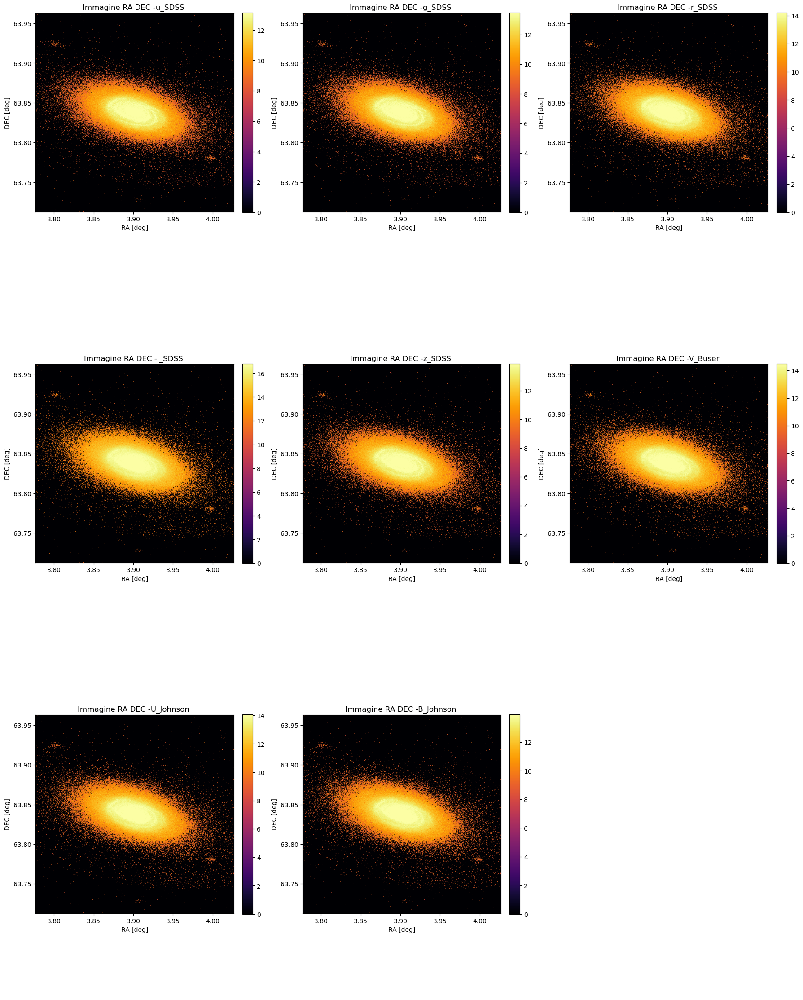

In [5]:
# Definisco una distanza arbitraria tra osservatore e galassia: 10 Mpc (in parsec)
d_pc = 1e7  
# Array dei flussi di riferimento F0 (in erg/s/cm²/Hz) per ogni banda
F0 = np.array([
    3.631e-20,  # u_SDSS 
    3.631e-20,  # g_SDSS 
    3.631e-20,  # r_SDSS 
    3.631e-20,  # i_SDSS 
    3.631e-20,  # z_SDSS 
    3.75e-20,   # V_Buser 
    1.81e-20,   # U_Johnson 
    1.26e-20    # B_Johnson 
])

# Tempo di esposizione
exptime=600  # secondi

# 1) Calcolo magnitudini apparenti dalle magnitudini assolute, quelle del dataset
mags_apparent = mags + 5 * np.log10(d_pc) - 5

# 2) Calcolo flussi fisici assoluti  moltiplicati per il tempo di esposizione
flux_absolute = F0 * 10 ** (-0.4 * mags_apparent)  *exptime

# 3) Sposto la galassia lungo l'asse z (10 Mpc = 10000 kpc), l'osservatore è nell'origine 
d_kpc = 10000
coords_shifted = coords.copy()
coords_shifted[:, 2] += d_kpc  

# 4) Calcolo coordinate RA e DEC in gradi 
x, y, z = coords_shifted[:, 0], coords_shifted[:, 1], coords_shifted[:, 2]
r = np.sqrt(x**2 + y**2 + z**2)
ra = np.arctan2(y, x)         # radianti  # a differenza dell'arct(y/x) arct2 funziona su tutti i quadranti 
dec = np.arcsin(z / r)        # radianti
ra_deg = np.degrees(ra) % 360     # [0, 360]
dec_deg = np.degrees(dec)         # [-90, 90]

# 5) Mappo su immagine 2D RA e DEC
img_size = 512 # risoluzione in pixel dell’immagine finale

# 5.1) Calcolo range centrato sulla galassia (solo per effetto visivo)
ra_center = np.median(ra_deg)
dec_center = np.median(dec_deg)
ra_width = 0.25  
dec_width =0.25  
# faccio andare il campo visivo da ra\dec_center - ra\dec_width / 2 (bordo sinistro) a ra\dec_center + ra\dec+_width / 2 (bordo destro)
ra_range = (ra_center - ra_width / 2, ra_center + ra_width / 2)
dec_range = (dec_center - dec_width / 2, dec_center + dec_width / 2)

# 5.2) Mappo RA e DEC in coordinate di pixels, normalizzando al campo visivo 
pixels_x = ((ra_deg - ra_range[0]) / (ra_range[1] - ra_range[0]) * img_size).astype(int)
pixels_y = ((dec_deg - dec_range[0]) / (dec_range[1] - dec_range[0]) * img_size).astype(int)
# elimino i pixel fuori dalla camera
valid = (pixels_x >= 0) & (pixels_x < img_size) & (pixels_y >= 0) & (pixels_y < img_size)

# 6) Calcolo l'immagine per ogni banda
scaling_factor = 1e30  # porta flussi a scala visibile come intensità pixel (sarebbero troppo piccoli)
images_radec = []

# 6.1) Calcolo i flussi e creo le iimagini
for i in range(8): 
    image = np.zeros((img_size, img_size))
    flux_scaled = flux_absolute[:, i] * scaling_factor   # ricordo che i sono le bande
    np.add.at(image, (pixels_y[valid], pixels_x[valid]), flux_scaled[valid])
    image_stretched = np.arcsinh(image)
    images_radec.append(image_stretched)

# 6.2) Plotto
fig, axs = plt.subplots(3, 3, figsize=(18, 24))
for i, (img, label) in enumerate(zip(images_radec, band_labels)):
    row, col = i // 3, i % 3
    ax = axs[row, col]
    im = ax.imshow(img, origin='lower', cmap='inferno', 
    extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
    vmin=np.percentile(img, 10), vmax=np.percentile(img, 99) # imposta i limiti di colore usando i percentili 10-99 per una rappresentazione più equilibrata
    )
    ax.set_title(f"Immagine RA DEC -{label} ")
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

axs[2, 2].axis('off')
plt.tight_layout()
plt.show()

COMMENTO IL RISULTATO : si osserva che ho utilizzato soltanto parte delle informazioni del PartType4 e neppure tutti i tipi di particelle in dotazione. Questa scelta è stata motivata principalmente dal fatto che per i gas, che sono l'altra componente principale visibile, non è presente il dataset delle magnitudini; inoltre si è scelta la componente stellare in quanto è quella più facilmente osservabile ed analizzabile, anche tramite uno studio dei rumori. Nonostante il degrado osservativo, le caratteristiche peculiari della galassia sono chiaramente visibili con il mio programma, come la sua forma a spirale. Si nota inoltre che diverse bande accentuano diverse caratteristiche: le bande blu/UV sono cruciali per tracciare la struttura a spirale e la formazione stellare recente, quelle rosse/infrarosse rivelano la massa stellare totale, l’alone e il bulge.

# 4° PASSAGGIO: APPLICAZIONE DEL SEEING ALL'IMMAGINE DI CIASCUNA BANDA

Nella parte successiva del progetto (passaggi 4 e 5), l’immagine ideale della galassia viene “sporcata” aggiungendo rumori per rendere la simulazione più realistica, ovvero simile a quella che si otterrebbe con l'osservazione da un telescopio a terra. L'immagine che si otterrebbe con l'acqusizione dati con un telescopio terrestre, infatti, è degradata da effetti fisici ed elettronici, causati dal passaggio del segnale nell'atmosfera terrestre e dalle caratteristiche strutturali del telescopio stesso.  
Per simulare la situazione reale, come primo step (passaggio 4) nel programma si è analizzato il fenomeno del Seeing. 
I dati presi in input sono quelli generati dal passaggio 3, ovvero la mappa dei flussi stellari in coordinate celesti, che sono poi amplificati di un fattore 100 per rendere i segnali deboli più visibili (anche tenendo conto dell'aggiunta dei rumori nei passaggi successivi). Si è poi calcolato l'effetto del Seeing, con le modalità spiegate di seguito, e si è ottenuto come output un nuovo set di immagini.

Il seeing è un fenomeno atmosferico che causa la distorsione e l’allargamento apparente delle immagini astronomiche osservate da Terra. È dovuto principalmente alla turbolenza dell’atmosfera terrestre, che altera continuamente la traiettoria della luce proveniente dalle stelle e da altri oggetti celesti. Questo effetto fa sì che una sorgente puntiforme, come una stella, non appaia come un punto, ma come una macchia sfocata.   
Per simulare numericamente il seeing si utilizza una convoluzione, un’operazione matematica che combina l’immagine originale con una funzione gaussiana 2D, detta kernel o filtro. Questa funzione agisce come una maschera che, per il pixel considerato, calcola una media pesata dei pixel circostanti: quelli più vicini hanno un peso maggiore. 
Il seeing si quantifica tipicamente attraverso il FWHM (Full Width at Half Maximum) di questa funzione, espresso in arcosecondi: valori comuni vanno da 0.5" (condizioni ottimali) a 2" o più (condizioni pessime). Per costruire il kernel del seeing si deve usare $\sigma$, la deviazione standard della gaussiana, con: 
            $$\sigma=\frac{FWHM}{2.355}$$
La FWHM varia a seconda della banda considerata: le bande più rosse (come i e z) hanno seeing leggermente migliore, mentre quelle blu (come u) soffrono di seeing peggiore.  

In [6]:
# Amplifico le immagini di un fattore 100 : necessario nei passaggi successvi di aggiunta di ulteriori rumori di fondo
images_amplified = [image * 100 for image in images_radec]

# Calcolo la scala dell'immagine in arcsec per pixel
scale_arcsec_per_pix = (ra_width * 3600) / img_size  #ottengo quanti arcsec corrispondono a un singolo pixel

# FWHM in arcsec per ogni banda (dati presi da https://www.sdss4.org/dr17/imaging/other_info/)
fwhm_arcsec = {
    "u_SDSS": 1.7,
    "g_SDSS": 1.6,
    "r_SDSS": 1.5,
    "i_SDSS": 1.4,
    "z_SDSS": 1.3,
    "V_Buser": 1.55,
    "U_Johnson": 1.7,
    "B_Johnson": 1.6}

# Creo le immagini con il seeing
images_with_seeing = []
for img, label in zip(images_amplified, band_labels):
#for img, label in zip (images_radec,band_labels ):
    fwhm = fwhm_arcsec[label]                        
    fwhm_pix = fwhm / scale_arcsec_per_pix  # converto FWHM da arcsec a pixel 
    sigma_pix = fwhm_pix / 2.355     # ricavo la deviazione standard della gaussiana                         
    # Creo kernel gaussiano e applica convoluzione
    psf_kernel = Gaussian2DKernel(x_stddev=sigma_pix) #psf=point spread function, quanto si "spalma" la luce di una sorgente 
    img_seen = convolve(img, psf_kernel)
    images_with_seeing.append(img_seen)

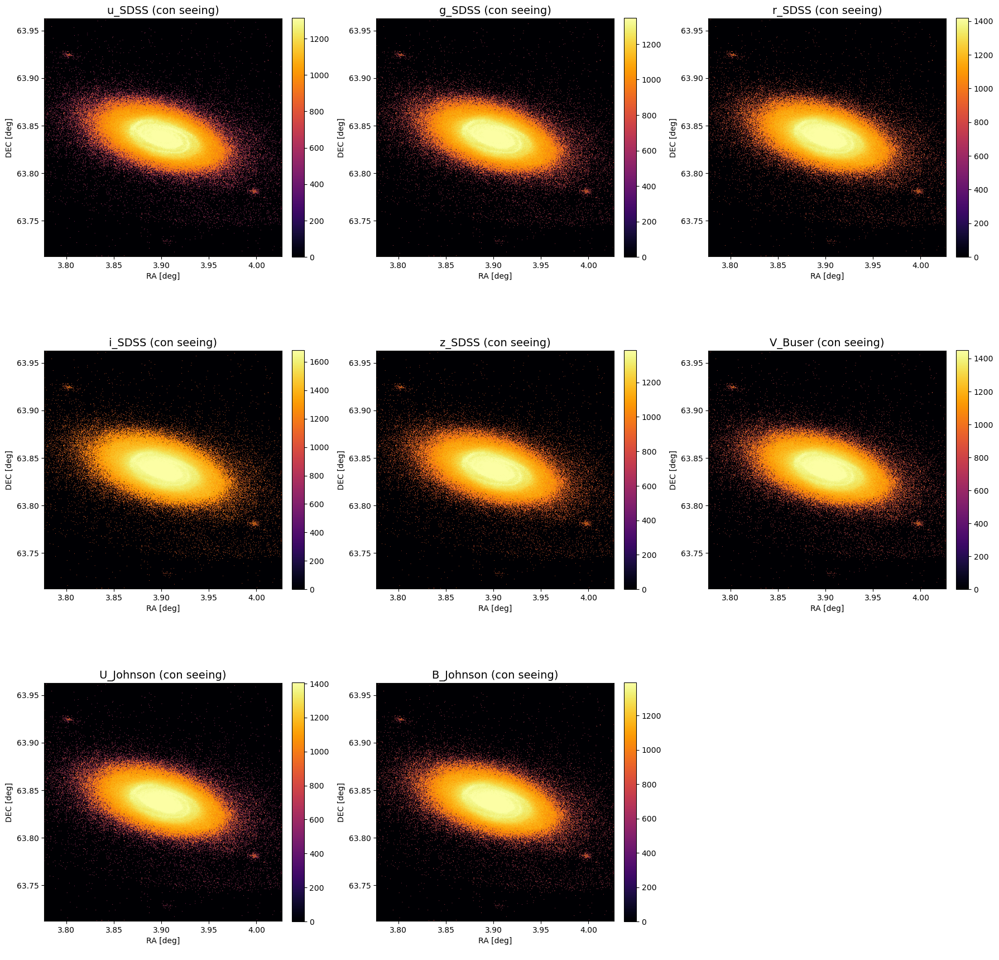

In [7]:
# Plot delle immagini con il seeing
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (img, label) in enumerate(zip(images_with_seeing, band_labels)):
    row, col = i // 3, i % 3
    ax = axs[row, col]
    im = ax.imshow(img, origin='lower', cmap='inferno',
                   extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
                   vmin=np.percentile(img, 10),
                   vmax=np.percentile(img, 99))
    ax.set_title(f"{label} (con seeing)", fontsize=14)
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

axs[2, 2].axis("off")
plt.tight_layout()
plt.show()

COMMENTO IL RISULTATO : in tutte le bande si osserva un generale ammorbidimento della morfologia: il nucleo appare più diffuso, le strutture fini come i bracci spiraliformi diventano meno definite e il contrasto tra le regioni centrali e periferiche si riduce. L’effetto è più marcato nelle bande blu e ultraviolette (u_SDSS, g_SDSS, U_Johnson), dove il seeing è peggiore, mentre bande come z_SDSS o i_SDSS mantengono una migliore risoluzione. 
Il set di valori di FWHM utilizzato per le 8 bande sono in un range compreso tra 1 e 2; considerando che FWHM = 5 corrisponde ad un seeing scarso e che FWHM= 0.4 corrisponde ad un seeing ottimo, osservo che il dataset si trova in una condizione intermedia. Per uno studio approfondito sarebbe necessario avere più set degli 8 valori in modo da poter simulare diverse condizioni atmosferiche. 

# 5° PASSAGGIO : AGGIUNTA DEI RUMORI DI FONDO CIELO E DEL TELESCOPIO

In questo blocco prendo in input le immagini simulate con seeing e, per ciascuna banda fotometrica, aggiungo i principali tipi di rumore strumentale e di fondo cielo; in output si ha quindi la "somma" tra l'immagine con il seeing e l'immagine con tutti i rumori.

Nelle osservazioni astronomiche, oltre al seeing atmosferico, esistono diversi tipi di rumore che degradano la qualità delle immagini e devono essere considerati per ottenere simulazioni realistiche. Tra i principali, troviamo il rumore del fondo cielo, il rumore di lettura, il dark current e la fluttuazione statistica del segnale (rumore di Poisson). 

Il rumore del fondo cielo è causato dalla luminosità naturale del cielo notturno (aria, Luna, inquinamento luminoso) e si misura in magnitudini per arcsec^2; nel programma viene convertito in elettroni/pixel usando la formula 
            $$ F= 10^{[-0.4 \cdot (m_{sky}-zeropoint)]} \cdot exptime \cdot area$$
e simulato con una distribuzione di Poisson.  
Il rumore di lettura è generato dall’elettronica del CCD durante la digitalizzazione del segnale, e si modella come una distribuzione normale (gaussiana) con media zero e deviazione pari al valore tipico del sensore (es. 5 e⁻).  
Il dark current è un rumore termico, dovuto alla generazione spontanea di elettroni nei pixel anche in assenza di luce: è proporzionale al tempo di esposizione e si simula con un’altra Poissoniana.  
Infine, anche il segnale astronomico vero e proprio è soggetto a fluttuazioni statistiche (rumore quantico) e anch’esso segue una distribuzione di Poisson, soprattutto per bassi flussi (aumenta al diminuire del segnale).

I contributi vengono sommati per ottenere un’immagine finale “noisy”, che rappresenta ciò che un telescopio da terra misurerebbe effettivamente.

In [8]:

# 1) Parametri di simulazione per il calcolo dei rumori

# 1.1) Parametri diversi per ogni banda
# Luminosità del fondo cielo (di nuovo https://www.sdss4.org/dr17/imaging/other_info/)

sky_mags = {
    "u_SDSS": 22.5,
    "g_SDSS": 22.8,
    "r_SDSS": 22.5,
    "i_SDSS": 21.9,
    "z_SDSS": 21.5,
    "V_Buser": 22.5,
    "U_Johnson": 22.5,
    "B_Johnson": 15.5
}

# Zeropoint = costante fotometrica che lega le magnitudini al flusso fisico misurato in elettroni 
zeropoint = {
    "u_SDSS": 22.5,
    "g_SDSS": 23.9,
    "r_SDSS": 23.5,
    "i_SDSS": 23.0,
    "z_SDSS": 22.0,
    "V_Buser": 22.5,
    "U_Johnson": 21.5,
    "B_Johnson": 19.5
}

# 1.2) Parametri comuni per tutte le bande     
pixel_scale = 0.1  # arcsec/pixel 
pixel_area = pixel_scale**2 # [arcsec^2/pixel]
gain = 1.0                  # e⁻/ADU
dark_current = 0.02          # e⁻/pix/sec
read_noise = 5.0            # e⁻ RMS


# 2) Calcolo dei rumori
noisy_images = []
for img_clean, label in zip(images_with_seeing, band_labels): # aplico i rumori sulle immagini già con il seeing
    # Rumore dovuto al fondo cielo
    m_sky = sky_mags[label]
    sky_electrons = 10**(-0.4 * (m_sky - zeropoint[label] )) * exptime * pixel_area
    sky_noise = np.random.poisson(sky_electrons, size=img_clean.shape)
    # Rumore della dark current
    dark = np.random.poisson(dark_current * exptime, size=img_clean.shape)
    # Rumore di lettura
    read = np.random.normal(loc=0.0, scale=read_noise, size=img_clean.shape)
    # rumore del segnale stesso
    signal = np.random.poisson(np.clip(img_clean, 0, None))
    # Somma di tutti i rumori
    total_electrons = signal + sky_noise + dark + read
    
    # Converto il numero totale di elettroni registrati in ciascun pixel in unità digitali 
    noisy_image = total_electrons / gain
    noisy_images.append(noisy_image)



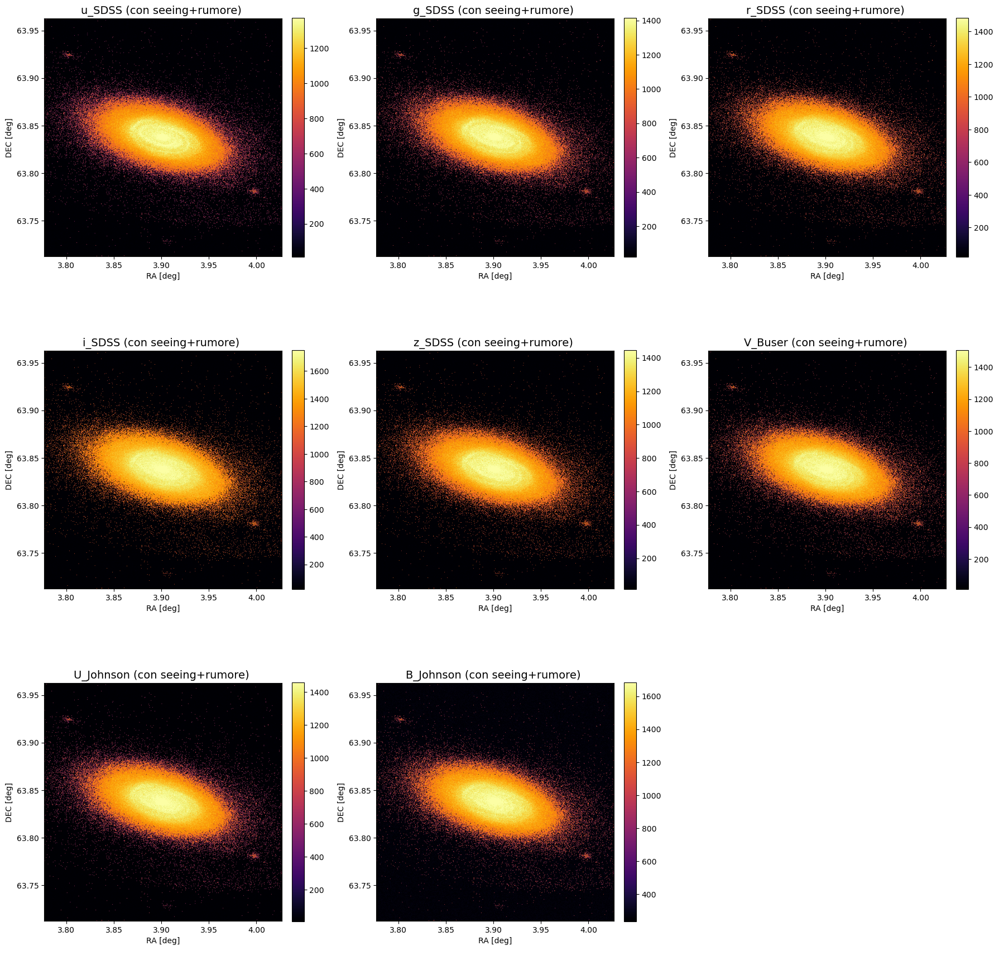

In [9]:
# Plotto i segnali con rumore
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
for i, (img, label) in enumerate(zip(noisy_images, band_labels)):
    row, col = i // 3, i % 3
    ax = axs[row, col]
    
    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99.5) )
    ax.set_title(f"{label} (con seeing+rumore) ", fontsize=14)
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
axs[2, 2].axis("off")
plt.tight_layout()
plt.show()


COMMENTO IL RISULTATO : in tutte le bande, l’immagine risulta disturbata rispetto a quella pulita o anche a quella che comprende il seeing. Analizzando visivamente si osserva che il fondo appare più granuloso e meno uniforme e i dettagli fini della galassia (soprattutto nelle regioni esterne e nei bracci) si confondono maggiormente con il background. L’effetto è più evidente nelle bande z_SDSS, u_SDSS ed i_SDSS, mentre in U_Johnson e B_Johnson sembrano sentire meno l'effetto dei rumori aggiunti. 
Ciascun rumore ha un proprio impatto sulla qualità finale dell'immagine: 
-rumore di fondo cielo: è il contributo dominante alla granulosità diffusa sullo sfondo. La sua intensità varia tra le bande, essendo maggiore nelle bande rosse (es. z_SDSS) dove il cielo è naturalmente più luminoso. Il fondo cielo riduce il contrasto tra la galassia e lo sfondo, rendendo meno nette le regioni più deboli e periferiche della sorgente.  
-dark current: contribuisce a una base diffusa di fondo, più omogenea ma comunque percettibile, soprattutto nei canali dove il segnale della galassia è debole (es. U_Johnson o z_SDSS).  
-read noise: è particolarmente visibile nei pixel più scuri, dove non è “mascherato” dal segnale galattico.  
-rumore di Poisson del segnale: è più evidente nel nucleo della galassia, dove il segnale è più elevato; infatti lì anche le fluttuazioni assolute sono più grandi (la varianza del segnale, che è l'errore di poisson, cresce).

Per un'analisi più quantitativa di cosa sia successo alle immagini della galassia con l'aggiunta dei rumori ci si rifà al paragrafo 6, in cui ho calcolato il rapoorto segnale-rumore nelle diverse bande.

# 6° PASSAGGIO : CALCOLO DEL RAPPORTO SEGNALE-RUMORE

In questa parte di codice si prende come input il risultato ottenuto al passaggio 5,ovvero le immagini con la somma dei 4 tipi di rumori considerati più il seeing, e si calcola il rapporto segnale rumore S/N. Si analizzano i risultati ottenuti per ciascuna banda confrontandoli con una generica tabella (sotto riportata) di qualità del rapporto segnale rumore. 
S/N viene calcolato sia per l’immagine amplificata, sia per quella originale, aspettandosi di ottenere output molto migliori per i segnali amplificati. 

Il rapporto segnale/rumore (S/N) è una misura quantitativa della qualità di un’osservazione astronomica: indica quanto il segnale proveniente da un oggetto celeste si distingue rispetto al rumore di fondo e strumentale. È fondamentale per valutare l’affidabilità di un'immagine e la possibilità di estrarre informazioni scientificamente significative: un alto S/N implica una rilevazione chiara, mentre un S/N basso rende difficile distinguere il segnale dal rumore casuale.  
Il calcolo del S/N globale per un'immagine simulata è:
            $$\frac{S}{N}=\frac{\sum_{i}S_i}{\sigma_{noise} \cdot \sqrt{N_{pix}}} $$  
dove $\sum_{i}S_i$ è il segnale totale sommato su tutti i pixel, $\sigma_{noise}$ + la deviazione standard del rumore (stimata empiricamente come la differenza tra immagine con rumore e segnale) e $N_{pix}$ è il numero di pixel con segnale diverso da zero.

In [10]:
for i, label in enumerate(band_labels):
    signal_unamp = images_amplified[i]           
    noisy = noisy_images[i]                  

    # 1. Totale segnale
    signal_tot_unamp = signal_unamp.sum()

    # 2. Rumore per pixel: stima empirica
    noise_estimate = noisy - signal  # residuo rumore=fluttuazioni casuali intorno al segnale atteso
    noise_std = np.std(noise_estimate) # deviazione standard del rumore

    # 3. Rumore totale (sommato in quadratura)
    noise_tot_same = noise_std * np.sqrt(np.count_nonzero(signal_unamp))  

    # 4. Rapporto S/N globale
    sn_unamp = signal_tot_unamp / noise_tot_same if noise_tot_same != 0 else 0

    print(f"\nBanda: {label}")
    print(f"  Rapporto S/N : {sn_unamp:.2f}")



Banda: u_SDSS
  Rapporto S/N : 5251.90

Banda: g_SDSS
  Rapporto S/N : 8017.56

Banda: r_SDSS
  Rapporto S/N : 8938.69

Banda: i_SDSS
  Rapporto S/N : 2558.86

Banda: z_SDSS
  Rapporto S/N : 7661.02

Banda: V_Buser
  Rapporto S/N : 7699.65

Banda: U_Johnson
  Rapporto S/N : 10406.44

Banda: B_Johnson
  Rapporto S/N : 14596.25


| S/N globale     | Valutazione    | Interpretazione                                                                 |
|-----------------|----------------|----------------------------------------------------------------------------------|
| > 1000          | Eccellente     | Il segnale è nettamente superiore al rumore. Immagine molto pulita e dettagliata. |
| 100 – 1000      | Ottimo         | Segnale forte e chiaro. Morfologia ben definita, adatta ad analisi quantitative. |
| 20 – 100        | Buono          | L’oggetto è distinguibile anche se il rumore è visibile in alcune regioni.       |
| 5 – 20          | Sufficiente    | Il segnale è presente ma comparabile al rumore. Adatto al rilevamento, meno a misure dettagliate. |
| < 5             | Scarso         | Il rumore domina. Difficile distinguere l’oggetto, alta incertezza nelle misure. |


COMMENTO IL RISULTATO : riferendosi alla tabella riportata sopra ed ai risultati di S/N ottenuti, si osserva che tutte le bande raggiungono rapporti S/N eccellenti, garantendo immagini nitide e morfologia ben leggibile.  

# 7° PASSAGGIO : AGGIUNTA DEI RAGGI COSMICI

In questo ultimo passaggio si prendono in input le immagini noisy generate al passaggio 6 e gli si aggiungono artificialmente, tramite distribuzioni uniformi casuali, dei punti luminosi di elevata intensità che simulano il disturbo causato dai raggi cosmici.  

I raggi cosmici sono particelle ad alta energia provenienti dallo spazio, originate da sorgenti come supernove, nuclei galattici attivi o eventi extragalattici. Quando colpiscono i rivelatori di un telescopio (soprattutto CCD), depositano energia sotto forma di segnali luminosi anomali, spesso localizzati e molto intensi, che non corrispondono a sorgenti astrofisiche reali. Anche se la loro incidenza è maggiore in orbita, possono essere rilevati anche da telescopi a terra. Si distinguono dal segnale reale per la loro forma puntiforme o lineare, isolata e spesso saturata, diversa dalla distribuzione diffusa della luce stellare o galattica. I raggi cosmici rappresentano un disturbo significativo nelle immagini astronomiche: possono falsare misure fotometriche o creare artefatti nell’identificazione di oggetti. Per rimuoverli, si usano tecniche di pulizia automatica (cosmic ray cleaning), come algoritmi di median filtering su più esposizioni, o identificazione diretta tramite analisi morfologica dei pixel anomali.

In [11]:
# Definisco una funzione per aggiungere raggi cosmici nelle immagini 
def add_cosmic_rays(image, n_rays=50, intensity_range=(5000, 20000), size_range=(1, 5)):
    img = image.copy()
    for _ in range(n_rays):
        x = np.random.randint(0, img.shape[1]) # scelgo una poszione calcolata casualmente(x,y) all'interno dell'immagine
        y = np.random.randint(0, img.shape[0])
        intensity = np.random.uniform(*intensity_range) # estraggo casualmente l'intensità del raggio dal range
        size = np.random.randint(*size_range)  # estraggo casualmente la dimensione del raggio dal range
        # Creo una maschera circolare di pixel da "illuminare", centrata nel pixel selezionato, per simulare un piccolo impatto a forma di disco
        y_indices, x_indices = np.ogrid[-size:size+1, -size:size+1]
        mask = x_indices**2 + y_indices**2 <= size**2
        try: # evito errori se il raggio cade troppo vicino al bordo
            img[y-size:y+size+1, x-size:x+size+1][mask] += intensity  # aggiungo l’intensità al cluster di pixel selezionato, solo dove la maschera è vera
        except:
            # se cluster esce dai bordi dell’immagine, viene ignorato senza fermare l’esecuzione
            continue
    return img

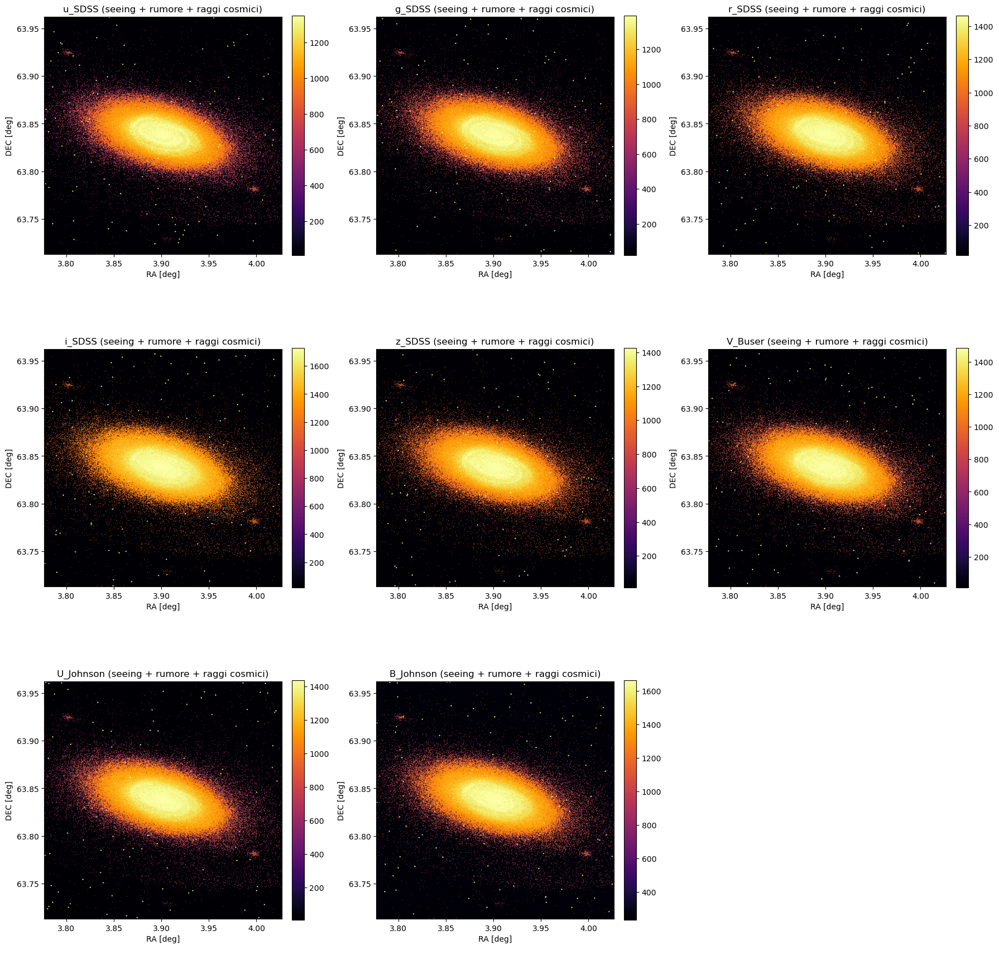

In [12]:
# Applico raggi cosmici a ciascuna immagine con rumore
noisy_images_with_cosmics = []
for img in noisy_images:
    img_with_cosmic = add_cosmic_rays(img,
        n_rays=100,  # uso 100 raggi cosmici per immagine
        intensity_range=(8000, 25000),  # alzo il livello di intensità
        size_range=(1, 2))  # diminuisco le dimensioni (piccoli puntini)
    noisy_images_with_cosmics.append(img_with_cosmic)

# Plot delle immagini con raggi cosmici 
fig, axs = plt.subplots(3, 3, figsize=(18, 18))
for i, (img, label) in enumerate(zip(noisy_images_with_cosmics, band_labels)):
    row, col = i // 3, i % 3
    ax = axs[row, col]
    im = ax.imshow(img, origin='lower', cmap='inferno',
                   extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
                   vmin=np.percentile(img, 10),
                   vmax=np.percentile(img, 99))
    ax.set_title(f"{label} (seeing + rumore + raggi cosmici)")
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
axs[2, 2].axis("off")
plt.tight_layout()
plt.show()

COMMENTO IL RISULTATO : in bande come u_SDSS o i_SDSS, dove il rapporto S/N è già minore, l'effetto dei raggi cosmici risulta più intrusivo, poiché il contrasto tra segnale reale e disturbo è più basso.

# CONCLUSIONE

Per concludere il mio studio sul processo inverso della pulizia di immagini astronomiche, metto a confronto le immagini ottenute nei diversi step e prendo in particolare una banda, quella u_SDSS in quanto è una dove il rumore ha avuto un impatto notevole, come si osserva dal suo valore di S/N "basso".

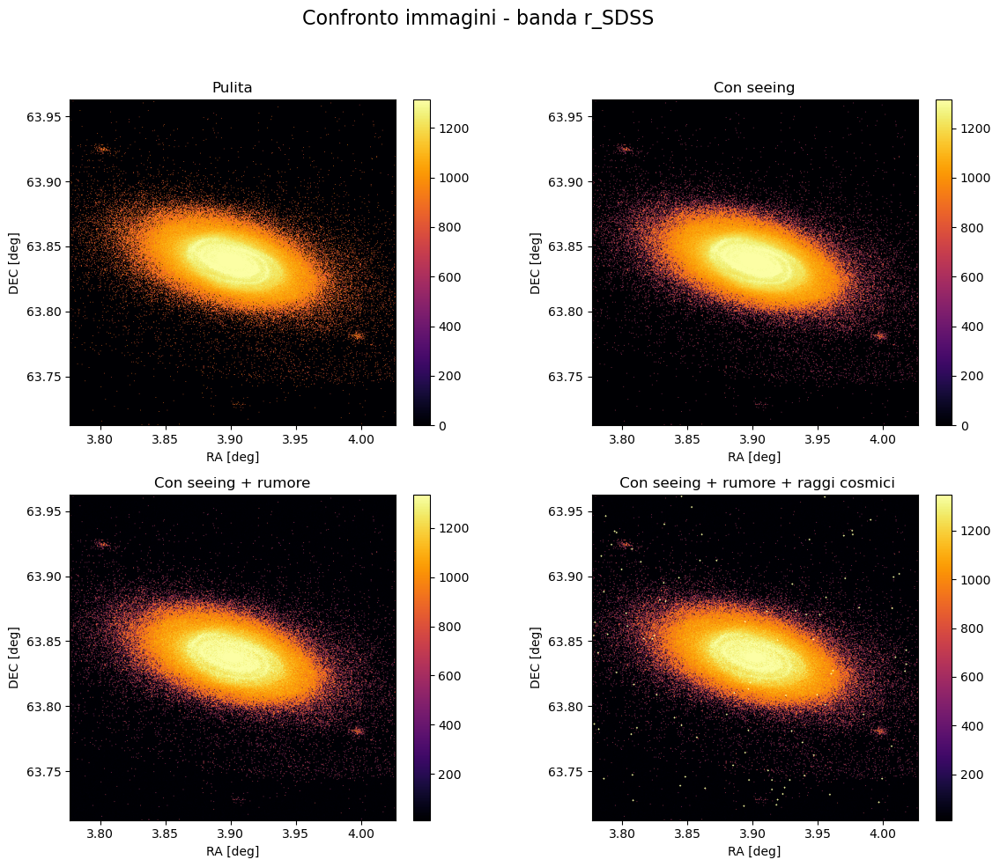

In [13]:
# Faccio il confronto per la sola banda r_SDSS presa come esempio
comparison_images = [
    images_amplified[band_labels.index('u_SDSS')],
    images_with_seeing[band_labels.index('u_SDSS')],
    noisy_images[band_labels.index('u_SDSS')],
    noisy_images_with_cosmics[band_labels.index('u_SDSS')]]
titles = ["Pulita", "Con seeing", "Con seeing + rumore", " Con seeing + rumore + raggi cosmici"]

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
for i, (img, title) in enumerate(zip(comparison_images, titles)):
    row, col = divmod(i, 2)
    ax = axs[row, col]
    im = ax.imshow(img, origin='lower', cmap='inferno',
                   extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
                   vmin=np.percentile(img, 10), vmax=np.percentile(img, 99))
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

fig.suptitle("Confronto immagini - banda r_SDSS", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# APPENDICE [A] : CALCOLO LA SED DELLA GALASSIA, CHE MI PERMETTE DI EVIDENZIARE LE SUE CARATTERISTICHE PECULIARI

La Spectral Energy Distribution (SED) di una sorgente astrofisica è la rappresentazione del suo flusso spettrale in funzione della frequenza, ovvero mostra quanta energia viene emessa a ciascuna frequenza. Per le galassie, la SED rappresenta la somma dei contributi di tutte le popolazioni stellari, del mezzo interstellare (gas e polveri), e di eventuali componenti attive (come AGN). Essa contiene quindi una ricchezza di informazioni sulle proprietà fisiche globali, come l'età, metallicità, tassi di formazione stellare, estinzione da polveri.  
Poiché la galassia simulata è stata estratta dal database Illustris e presenta massa e struttura compatibili con una galassia di tipo Milky Way-like, ci si aspetta che la sua SED mostri caratteristiche tipiche delle galassie a spirale mature: un picco nel regime ottico-rosso, dove brillano le popolazioni stellari vecchie, e un graduale calo verso l’ultravioletto, causato dalla minore presenza di giovani stelle massicce e calde.

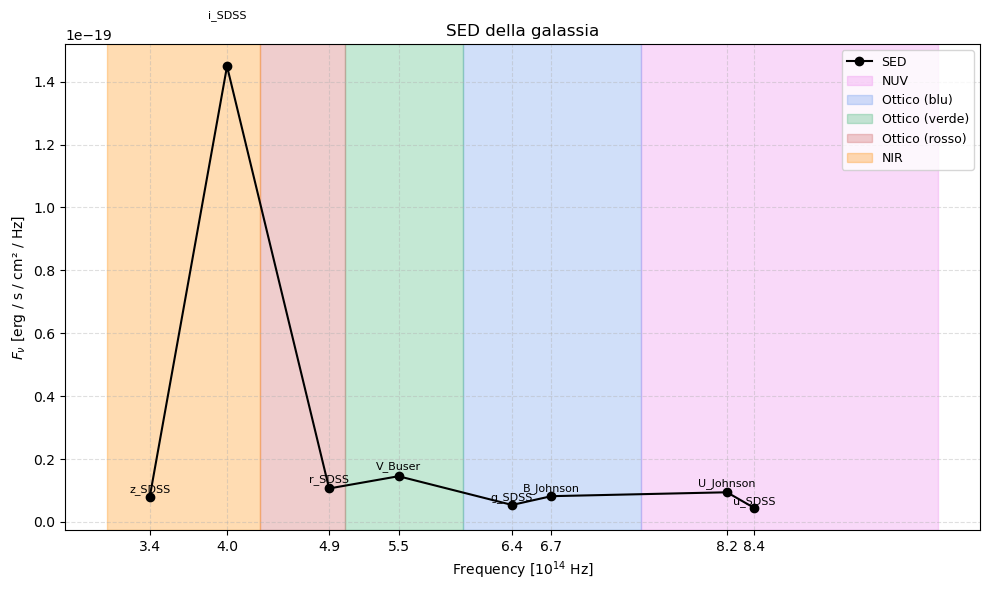

In [14]:
# 1) Calcolo i punti da mettere nelle SED 
# Lunghezze d’onda centrali (nm) delle 8 bande
wavelengths_nm = np.array([355, 468, 616, 748, 893, 550, 365, 445])
band_labels = ["u_SDSS", "g_SDSS", "r_SDSS", "i_SDSS", "z_SDSS", "V_Buser", "U_Johnson", "B_Johnson"]
# Velocità della luce in nm/s
c_nm_s = 2.998e17
# Conversione da lunghezza d’onda a frequenza [Hz]
frequencies_Hz = c_nm_s / wavelengths_nm
# Sommo i flussi su tutte le particelle che appartengono alla banda per avere 1 valore unico di flusso per ogni banda
flux_Fnu = flux_absolute.sum(axis=0)  
#NB: flux_absolute[i, j] è il flusso della particella i nella banda j, quindi fare .sum(axis=0) vuol dire sommare su tutte le particelle

# 2) Preparo il grafico della SED
# Ordino per frequenza crescente
sorted_indices = np.argsort(frequencies_Hz)
frequencies_Hz = frequencies_Hz[sorted_indices]
flux_Fnu = flux_Fnu[sorted_indices]
band_labels_sorted = np.array(band_labels)[sorted_indices]
# Definisco le regioni spettrali utili alla mia SED
regions = {
    "NUV":            (c_nm_s / 400, c_nm_s / 300),
    "Ottico (blu)":   (c_nm_s / 500, c_nm_s / 400),
    "Ottico (verde)": (c_nm_s / 600, c_nm_s / 500),
    "Ottico (rosso)": (c_nm_s / 700, c_nm_s / 600),
    "NIR":            (c_nm_s / 1000, c_nm_s / 700)}
# Do dei colori arbitrari alle bande per renderle più visibili
region_colors = {   
    "NUV": "violet",
    "Ottico (blu)": "cornflowerblue",
    "Ottico (verde)": "mediumseagreen",
    "Ottico (rosso)": "indianred",
    "NIR": "darkorange"}

# 3) Plotto il grafico
plt.figure(figsize=(10, 6))
plt.plot(frequencies_Hz, flux_Fnu, marker='o', linestyle='-', color='black', label="SED")

# Regioni spettrali evidenziate
for name, (fmin, fmax) in regions.items():
    plt.axvspan(fmin, fmax, color=region_colors[name], alpha=0.3, label=name)

# Etichette bande fotometriche
for nu, flux, label in zip(frequencies_Hz, flux_Fnu, band_labels_sorted):
    plt.text(nu, flux * 1.1, label, fontsize=8, ha='center', va='bottom')

plt.xticks(frequencies_Hz, [f"{x / 1e14:.1f}" for x in frequencies_Hz])
plt.xlabel(r"Frequency [$10^{14}$ Hz]")
plt.ylabel(r"$F_\nu$ [erg / s / cm² / Hz]")
plt.title("SED della galassia")
plt.grid(True, which='both', ls='--', alpha=0.4)
plt.legend( fontsize=9, loc='upper right')
plt.tight_layout()
plt.show()

OSSERVAZIONE : è emerso un chiaro picco anomalo nel vicino infrarosso (NIR) e questo comportamento non è quello tipicamente atteso per una galassia di tipo spirale come la Via Lattea, dove ci si aspetta una SED relativamente piatta !  
Questo effetto potrebbe essere sintomo della presenza dominante di popolazioni stellari vecchie e massicce, o di una componente metallica elevata, che può alterare significativamente la distribuzione dell’energia spettrale emessa.
E' quindi necessario analizzare più nel dettaglio le proprietà fisiche della popolazione stellare della galassia: in particolare la distribuzione delle età, la metallicità e la localizzazione spaziale delle stelle più luminose nelle bande NIR. Queste indagini permetteranno di capire se il picco osservato è dovuto a una popolazione stellare evoluta, ad una particolare distribuzione chimica, o ad un effetto geometrico e di proiezione. Inoltre, analizzando le proprietà medie pesate per flusso, sarà possibile evidenziare se l’emissione è dominata da sottopopolazioni stellari specifiche.  
NB: Si ricorda inoltre che le magnitudini in GFM_StellarPhotometrics non vengono calcolate per stelle appena formate, quindi esse non partecipano alla SED e di conseguenza l'emissione nel blu e nell'UV risulta sottostimata rispetto a quella delle stelle più vecchie, che brillano nel rosso/NIR.

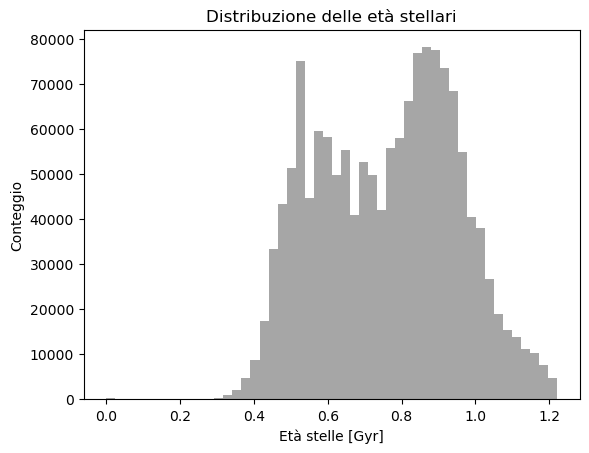

Età media per ogni banda:
u_SDSS: 0.96 Gyr
g_SDSS: 0.91 Gyr
r_SDSS: 0.87 Gyr
i_SDSS: 0.85 Gyr
z_SDSS: 0.90 Gyr
V_Buser: 0.86 Gyr
U_Johnson: 0.85 Gyr
B_Johnson: 0.85 Gyr


In [15]:
# 1) Leggo la GFM_StellarFormationTime per calcolare l'età delle stelle

with h5py.File(filename, 'r') as f:
    formation_times = f["PartType4"]["GFM_StellarFormationTime"][:N]  
# Converto i tempi di formazione in età delle stelle (Gyr)
ages_gyr = (formation_times - formation_times.min()) * 0.977  #valore minimo=tempo attuale e 0.977 serve per convertire in Gyr

# Faccio un istogramma delle età 
plt.hist(ages_gyr, bins=50, color='gray', alpha=0.7)
plt.xlabel("Età stelle [Gyr]")
plt.ylabel("Conteggio")
plt.title("Distribuzione delle età stellari")
plt.show()

# Calcolo età media delle stelle pesata per flusso per ciascuna banda
ages_per_band = []
for i in range(8): 
    # Calcola l'età media delle stelle che contribuiscono a questa banda
    flux = 10 ** (-0.4 * mags[:, i])  #flussi relativi
    weighted_ages = ages_gyr * flux # età pesata per flusso
    total_flux = flux.sum()  # sommo i flussi per normalizzare
    if total_flux > 0:  # se flusso non nullo calcolo età media pesata per la luce emessa in quella banda
        avg_age = weighted_ages.sum() / total_flux
    else:  # se flusso è nullo evito la divisione
        avg_age = 0
    ages_per_band.append(avg_age)

# Stampo le età medie per ogni banda
print(f"Età media per ogni banda:")
for label, age in zip(band_labels, ages_per_band):
    print(f"{label}: {age:.2f} Gyr")

COMMENTO IL RISULTATO : l’analisi della distribuzione delle età stellari mostra che la galassia è dominata da stelle relativamente giovani (0.1–1.2 Gyr), con un picco tra 0.8 e 1.0 Gyr. La totale assenza di stelle con età < 0.1 Gyr suggerisce l’esclusione delle stelle appena nate dal campo GFM_StellarPhotometrics, influenzando la SED e spostandola verso il NIR. Le età medie pesate per banda, comprese tra 0.85 e 0.96 Gyr, confermano l’assenza di contributi da stelle giovani: persino la banda u_SDSS, sensibile all’UV, è dominata da stelle evolute.

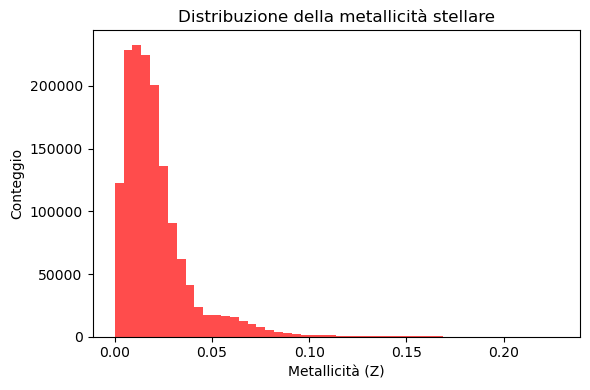

Metallicità media: 0.0212


In [16]:
# 2) Leggo la GFM_Metallicity per calcolare la metallicità,  ovvero la frazione di massa costituita da elementi più pesanti dell’elio (Z)
with h5py.File(filename, 'r') as f:
    metallicity = f["PartType4"]["GFM_Metallicity"][:N]  

# Istogramma delle metallicità
plt.figure(figsize=(6,4))
plt.hist(metallicity, bins=50, color='red', alpha=0.7)
plt.xlabel("Metallicità (Z)")
plt.ylabel("Conteggio")
plt.title("Distribuzione della metallicità stellare")
plt.tight_layout()
plt.show()

print(f"Metallicità media: {metallicity.mean():.4f}")

COMMENTO IL RISULTATO : la metallicità Z  è un indicatore fondamentale dello stadio chimico di evoluzione di una galassia. Valori bassi di Z (ex: Zwicki18,galassia nana irregolare molto giovane : 0.0002) corrispondono a stelle antiche formatesi in ambienti poveri di metalli, mentre valori alti (ex: M31, a spirale massiccia : 0.02-0.03) indicano formazione da gas già arricchito da precedenti generazioni stellari. Nel caso della galassia simulata, la distribuzione delle metallicità mostra una netta concentrazione tra 0.005 e 0.03, con una coda verso valori più elevati. La metallicità media è leggermente superiore a quella solare (0.013) e del tutto compatibile con una galassia evoluta di tipo Milky Way-like (0.015−0.02). Questo supporta l’idea di una popolazione stellare matura, coerente con l’età media rilevata (0.9 Gyr) e suggerisce che l’arricchimento chimico ha già avuto luogo in modo significativo.

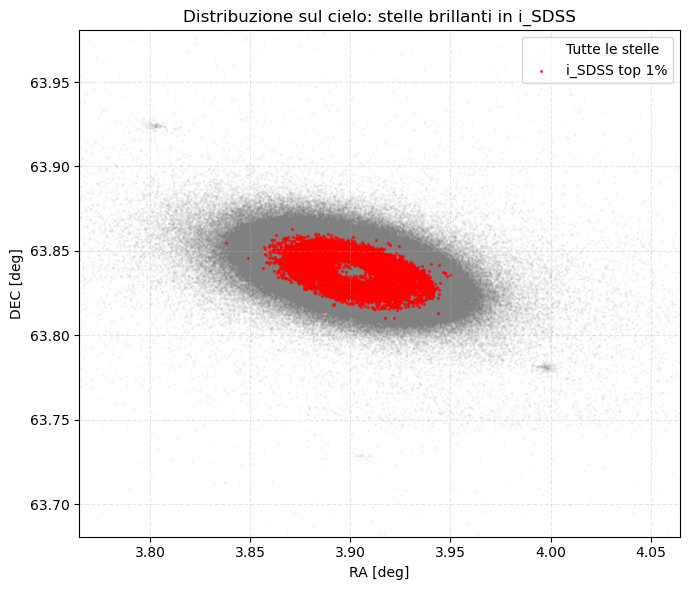

In [17]:
# 3) Cerco dove si posizionano le stelle più brillanti nella banda che è risultata essere la più brillante: l'i_SDSS

# Calcolo del flusso relativo nella banda i_SDSS
flux_i = 10 ** (-0.4 * mags[:, band_labels.index("i_SDSS")])

# Seleziono il top 1% delle stelle più luminose in i_SDSS
threshold = np.percentile(flux_i, 99) # calcolo il percentile 99 del flusso di i_SDSS
bright_i_mask = flux_i > threshold # prendo le stelle sopra alla soglia

# Estraggo RA e DEC di queste stelle
ra_bright = ra_deg[bright_i_mask]
dec_bright = dec_deg[bright_i_mask]

# Scatter plot
plt.figure(figsize=(7, 6))
plt.scatter(ra_deg, dec_deg, s=1, alpha=0.05, color='gray', label='Tutte le stelle')
plt.scatter(ra_bright, dec_bright, s=2, alpha=0.6, color='red', label='i_SDSS top 1%')
plt.xlabel("RA [deg]")
plt.ylabel("DEC [deg]")
plt.title("Distribuzione sul cielo: stelle brillanti in i_SDSS")
plt.legend(loc="upper right")
plt.grid(True, ls='--', alpha=0.3)

# Zoom su una regione centrale attorno alla mediana, come avevo fatto nei grafici prima di questa sezione
ra_center = np.median(ra_bright)
dec_center = np.median(dec_bright)
ra_width = 0.30
dec_width = 0.30
plt.xlim(ra_center - ra_width / 2, ra_center + ra_width / 2)
plt.ylim(dec_center - dec_width / 2, dec_center + dec_width / 2)

plt.tight_layout()
plt.show()

COMMENTO IL RISULTATO : le stelle più luminose in banda NIR sembrano trovarsi nella parte centrale della galassia, ma non del tutto all'interno del bulge.   

CONCLUDO FACENDO UN'IPOTESI : si potrebbe pensare che le stelle che ho visualizzato nell'ultimo plot, che sono anche quelle che più incidono nel flusso luminoso facendo un picco nella SED nella banda i_SDSS, siano delle AGB, ovvero Asymptotic Giant Branch.  
Sono stelle evolute, che hanno esaurito l’idrogeno e l’elio nei loro nuclei, hanno massa intermedia (all'inizio di 1–8 $M_{solari}$), sono molto luminose e fredde in superficie (rosse) e hanno età tipiche comprese tra 0.2 e 2 Gyr. Dal punto di vista spaziale, non si concentrano nel centro delle galassie ma si distribuiscono in modo più diffuso, spesso in anelli o fasce nel disco. Ad esempio, lo studio su M33 mostra chiaramente che le AGB sono prevalenti in un anello metal-rich esterno alla regione centrale("AGB stars as tracers of metallicity and mean age across M 33",Cioni, M.-R. L., et al. (2008)). Anche nella nostra galassia è stato dimostrato che le AGB si trovano al di fuori del centro, sebbene non proprio disposte ad anello come in M33("The Galactic Distribution of Asymptotic Giant Branch Stars",Jackson,T, et al.(2002)).  
Inoltre non tutte le AGB sono metalliche, ma a loro metallicità dipende strettamente dall’ambiente e dall’epoca in cui si sono formate: se effettivamente esse sono presenti in regioni evolute come il disco interno di una galassia Milky Way-like, è sensato ipotizzare che esse siano ricche di metalli.

# APPENDICE [B] : DIAGRAMMA COLORE-MAGNITUDINE (HR-LIKE)

Il diagramma colore-magnitudine (CMD) è simile al diagramma Hertzsprung-Russell teorico, ma rappresenta in ascissa il colore di una stella (cioè la differenza di magnitudine tra due bande, come g−r, che indica la temperatura superficiale), e in ordinata la sua luminosità (tipicamente una magnitudine assoluta in una singola banda, come la r). Serve a distinguere le diverse fasi evolutive delle stelle: la sequenza principale, le giganti rosse, le AGB, e così via.  

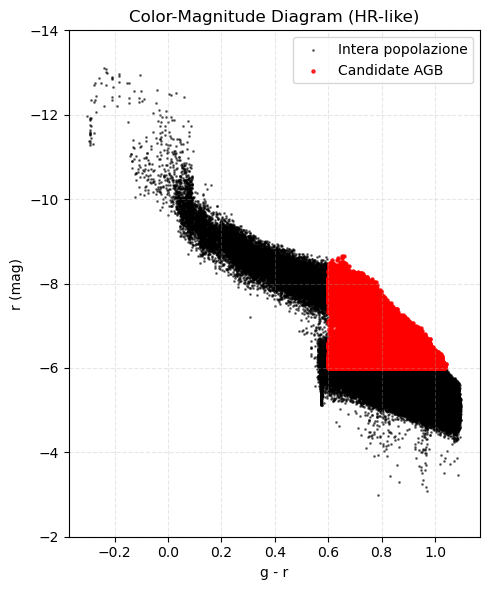

In [18]:
# Estraggo le magnitudini assolute nelle bande g e r per tutte le particelle stellari
g = mags[:, band_labels.index("g_SDSS")]
r = mags[:, band_labels.index("r_SDSS")]

# Colore g - r
color_gr = g - r
#NB: valori piccoli = stelle blu e calde, valori grandi = stelle rosse e fredde

# Asse y: magnitudine r
r_mag = r

# Criteri per AGB candidates
is_agb = (color_gr > 0.6) & (r_mag < -6) 

# Plot
plt.figure(figsize=(5, 6))
plt.scatter(color_gr, r_mag, s=1, alpha=0.5, c='k',label='Intera popolazione')
plt.scatter(color_gr[is_agb], r_mag[is_agb], s=5, alpha=0.8, color='red', label='Candidate AGB')
plt.xlabel("g - r")
plt.ylabel("r (mag)")
plt.gca().invert_yaxis()  # inverto per attenermi alla convenzione delle magnitudini
plt.ylim(-2,-14)
plt.title("Color-Magnitude Diagram (HR-like)")
plt.grid(True, ls='--', alpha=0.3)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

COMMENTO IL RISULTATO : il diagramma ottenuto sembra ben strutturato, con le stelle più giovani, blu e luminose concentrate in alto a sinistra (g – r basso, r luminoso), mentre le stelle più evolute, rosse e meno brillanti si dispongono verso il basso a destra.   
I candidati AGB evidenziati in rosso si collocano nella regione attesa: sono luminosi (r < –6) e rossi (g – r > 0.6) ("Absolute Magnitude Calibration for Giants Based on the Colour–Magnitude Diagrams of Galactic Clusters", Karaali,S., et al.,2013). La loro abbondanza era già prevedibile dall’analisi della SED e questo diagramma colore-magnitudine (g – r vs. r) è particolarmente efficace nel metterle in evidenza.